<a href="https://colab.research.google.com/github/n1rjal/provathan-backend/blob/master/Provathan_Keras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers,optimizers
from tensorflow.keras.layers.experimental import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.externals import joblib 
import matplotlib.pyplot as plt
import seaborn as sns

print(tf.__version__)
!python --version

2.5.0
Python 3.7.10


/usr/local/lib/python3.7/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [2]:
data = pd.read_csv("/content/drive/MyDrive/Data Set/risk dataset.csv",index_col=[0])
data.head()

,sp02,temperature,C-reactive protein,haemoglobin,wbc_count,platelet count,kidney disease,heart disease,auto immunity disease,respiratory disease,risk
0,57,102.5,0.4,17.5,7.3,367.7,False,True,True,True,84.00
1,40,104.3,3.4,15.6,5.5,306.2,True,False,True,False,92.55
2,81,103.4,3.8,16.5,10.4,398.0,False,False,True,False,28.00
3,53,98.1,0.2,17.1,6.6,243.0,False,False,True,False,57.00
4,61,105.7,4.2,13.9,7.2,393.3,True,True,False,True,83.00


In [3]:
## No nan values so let not drop anything
data.isna().sum()

sp02                     0
temperature              0
C-reactive protein       0
haemoglobin              0
wbc_count                0
platelet count           0
kidney disease           0
heart disease            0
auto immunity disease    0
respiratory disease      0
risk                     0
dtype: int64

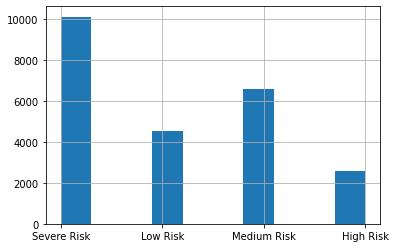

In [4]:
def calcRiskLabel(risk):
  
  if (risk < 40):
    return "Low Risk"
  elif (risk>40 and risk<60):
    return "Medium Risk"
  elif (risk>60 and risk<70):
    return "High Risk"
  elif (risk>70 and risk<100):
    return "Severe Risk"

data["result"] = data.apply(lambda row:calcRiskLabel(row["risk"]),axis=1)
data["result"].hist()

In [5]:
sns.pairplot(data,height=10)

<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


In [6]:
data.describe()

,sp02,temperature,C-reactive protein,haemoglobin,wbc_count,platelet count,risk
count,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000
mean,64.968920,101.505500,2.537356,15.748200,7.263328,299.821864,63.770424
std,20.392546,2.592972,1.409056,1.307925,1.878001,86.638704,23.851088
min,30.000000,97.000000,0.100000,13.500000,4.000000,150.000000,0.000000
25%,47.000000,99.300000,1.300000,14.600000,5.600000,224.900000,44.000000
50%,65.000000,101.500000,2.500000,15.800000,7.300000,299.900000,62.000000
75%,83.000000,103.700000,3.800000,16.900000,8.900000,374.900000,92.575000
max,100.000000,106.000000,5.000000,18.000000,10.500000,450.000000,95.000000


In [7]:
#lets change data into features and labels

y= data.pop("risk")
data.pop("result")
X= data.astype("float32")
y

0      84.00
1      92.55
2      28.00
3      57.00
4      83.00
       ...  
995    61.00
996    62.00
997    65.00
998    58.00
999    78.00
Name: risk, Length: 25000, dtype: float64

In [8]:
#lets check for shape of X and y
print("Shape of X ",X.shape)
print("Dim of X ",X.ndim)
print("Shape of y ",y.shape)
print("Dim of y ",y.ndim)


X.head()

Shape of X  (25000, 10)
Dim of X  2
Shape of y  (25000,)
Dim of y  1


,sp02,temperature,C-reactive protein,haemoglobin,wbc_count,platelet count,kidney disease,heart disease,auto immunity disease,respiratory disease
0,57.0,102.500000,0.4,17.5,7.3,367.700012,0.0,1.0,1.0,1.0
1,40.0,104.300003,3.4,15.6,5.5,306.200012,1.0,0.0,1.0,0.0
2,81.0,103.400002,3.8,16.5,10.4,398.000000,0.0,0.0,1.0,0.0
3,53.0,98.099998,0.2,17.1,6.6,243.000000,0.0,0.0,1.0,0.0
4,61.0,105.699997,4.2,13.9,7.2,393.299988,1.0,1.0,0.0,1.0


In [9]:
### Lets make train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)


In [10]:
## lets scale our data using robust scalar
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)



In [11]:
#lets make keras model
model = keras.Sequential()
model.add(layers.Dense(10,input_shape=(1,10),activation="relu"))
model.add(layers.Dense(64,activation="relu"))
model.add(layers.Dense(128,activation="relu"))
model.add(layers.Dense(128,activation="relu"))
model.add(layers.Dense(64,activation="relu"))
model.add(layers.Dense(1,activation="relu"))

In [12]:
model.compile(loss='mse', optimizer='adam', metrics=['mse', 'mae'])

In [13]:
#train the neural network on the train dataset
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
500/500 [==============================] - 3s 4ms/step - loss: 453.5067 - mse: 453.5067 - mae: 14.1585 - val_loss: 58.9024 - val_mse: 58.9024 - val_mae: 6.0839
Epoch 2/10
500/500 [==============================] - 1s 2ms/step - loss: 52.6948 - mse: 52.6948 - mae: 5.7740 - val_loss: 48.4430 - val_mse: 48.4430 - val_mae: 5.4741
Epoch 3/10
500/500 [==============================] - 1s 2ms/step - loss: 47.4794 - mse: 47.4794 - mae: 5.4843 - val_loss: 48.2829 - val_mse: 48.2829 - val_mae: 5.4831
Epoch 4/10
500/500 [==============================] - 1s 2ms/step - loss: 45.1687 - mse: 45.1687 - mae: 5.3205 - val_loss: 49.6237 - val_mse: 49.6237 - val_mae: 5.5953
Epoch 5/10
500/500 [==============================] - 1s 2ms/step - loss: 42.6814 - mse: 42.6814 - mae: 5.1556 - val_loss: 41.1957 - val_mse: 41.1957 - val_mae: 4.9642
Epoch 6/10
500/500 [==============================] - 1s 2ms/step - loss: 41.4131 - mse: 41.4131 - mae: 5.0690 - val_loss: 39.2515 - val_mse: 39.2515 - val_m

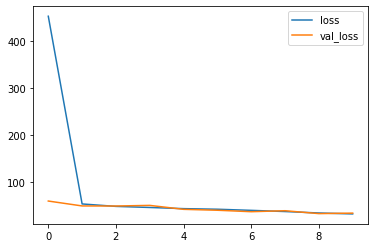

In [14]:
#plot the loss and validation loss of the dataset
history_df = pd.DataFrame(history.history)
plt.plot(history_df['loss'], label='loss')
plt.plot(history_df['val_loss'], label='val_loss')

plt.legend()


In [15]:
# Evaluate the model on the test data using `evaluate`
print("Evaluate on test data")
results = model.evaluate(X_test, y_test, batch_size=128)
print("test loss, test acc:", results)

# Generate predictions (probabilities -- the output of the last layer)
# on new data using `predict`
print("Generate predictions for 3 samples")
predictions = model.predict(X_test[:3])
print("predictions shape:", predictions.shape)

Evaluate on test data
40/40 [==============================] - 0s 2ms/step - loss: 33.1647 - mse: 33.1647 - mae: 4.4950
test loss, test acc: [33.16465759277344, 33.16465759277344, 4.495000839233398]
Generate predictions for 3 samples
predictions shape: (3, 1)


Text(0.5, 1.0, 'A plot that shows the true and predicted values')

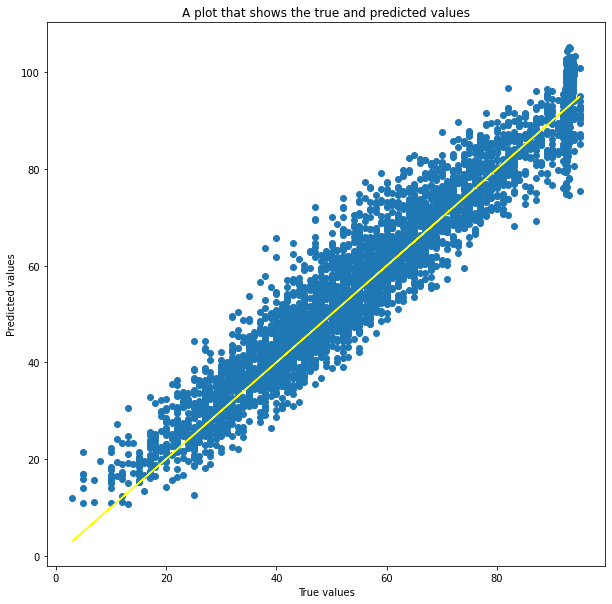

In [16]:
y_pred = model.predict(X_test).flatten()
plt.figure(figsize=(10,10))
plt.scatter(y_test, y_pred, linewidths=1)
plt.plot(y_test,y_test,color="yellow",label="Real Value")
plt.xlabel('True values')
plt.ylabel('Predicted values')
plt.title('A plot that shows the true and predicted values')

In [17]:
model.save("provathan model.h5")
joblib.dump(scaler,"minmax.pkl")

['minmax.pkl']

In [18]:
# the model in the server has 300 epoch
class ProvathanModel:
  def __init__(self,model_path,min_max_path):
    self.MinMaxScalar= joblib.load(min_max_path) 
    self.model= keras.models.load_model(model_path)

  def predict(self, sp02, temperature, CRP, HMG, WBC, PC, KD, HD, AD, RD):
    '''
    Argument List
    -------------
    SP02 level: float
    Range: [ 30-100 ] 
    Oxygen level in Blood

    Temperature: float
    Range: [96.0 - 106.0 ]
    Temperature of Human Body
    
    C-reactive protein: float 
    Range: [ 0.0 - 5.0 ]
    C reactive portien (in mg/L)

    HMG: float
    Range: [ 13.5 - 18.0 ]
    Haemoglobin count in gm/dL
    
    WBC: float
    Range: [ 4.0 - 10.5 ]
    WBC count WBCs in the blood in WBCs per microliter

    PC: int
    Range: [ 150 - 450 ]
    
    KD: bool
    Has kidney Disease
    True or False
    
    HD: bool
    Has any kind of heart disease
    True or False

    AD: bool
    Has any kind of auto immunity disease
    True or False

    RD: bool
    Has any kind of Respiratory disease
    True or False
    '''
    input = pd.DataFrame({"sp02":[sp02],
                       "temperature":[temperature],
                       "C-reactive protein":[CRP],
                       "haemoglobin":[HMG],
                       "wbc_count":[WBC],
                       "platelet count":[PC],
                       "kidney disease":[KD],
                       "heart disease":[HD], 
                       "auto immunity disease":[AD],
                       "respiratory disease":[RD]
                       }).astype("float32")
    
    normalized_input = self.MinMaxScalar.transform(input)
    result = self.model.predict( normalized_input )
    return float(result)

In [19]:
M1= ProvathanModel(model_path="/content/provathan model.h5", min_max_path="/content/minmax.pkl")
M1.predict(
    sp02= 100,
    temperature= 103,
    CRP= 4.0,
    HMG= 17.5,
    WBC= 7.5,
    PC= 150,
    KD= False,
    HD= False,
    AD= False,
    RD= False
)

23.49274253845215